In [1]:
import numpy as np
from astropy.cosmology import FlatLambdaCDM, Flatw0waCDM
from reportlab.graphics.renderPM import drawToPIL

from wowadis_muilt import run_cosmological_distances_multiprocessing,dh_inmpc,bao_dv_distance,bao_dv_dr,bao_fap,sne_luminosity_distance,log_likelihood, dm_inmpc,sne_distmod, run_lcdm_om0_by_multiprocessing,run_lcdm_methods_om0_by_multiprocessing, run_gaussian_methods_om0_by_multiprocessing, calculate_om0_distributions, run_mcmc
from scipy.optimize import minimize
import emcee
import matplotlib.pyplot as plt
import corner
import pandas as pd
from scipy.spatial import KDTree
import astropy.units as u
from scipy.stats import gaussian_kde
import gzip

data = np.genfromtxt('data/DES-SN5YR_HD.csv',
                     delimiter=',', names=True, dtype=None, encoding='utf-8')
zHEL_array = data['zHEL']
MUERR_FINAL_array = data['MUERR_FINAL']

with gzip.open('data/STAT+SYS.txt.gz', 'rt') as f:
    data = np.loadtxt(f, skiprows=1)
print("Data shape before reshape:", data.shape)

C_SYS = data.reshape((1829, 1829))
print("C_SYS shape after reshape:", C_SYS.shape)
cov_matrix_sne = np.diag(MUERR_FINAL_array ** 2) + C_SYS


print(zHEL_array)
print(MUERR_FINAL_array)
z_desy5 = np.array(zHEL_array)
des_sne_cosmo_wowa = Flatw0waCDM(H0=70, Om0=0.495, w0=-0.36, wa=-8.8)
distmod_error_desy5 = np.array(MUERR_FINAL_array)
#sne_distmod
des_distmod_compare_desy5 = sne_distmod(z=z_desy5, H0=70, Om0=0.495, w0=-0.36, wa=-8.8, cosmo=des_sne_cosmo_wowa)
# from paper:
zeff = np.array([0.295, 0.510, 0.706, 0.930, 1.317, 1.491, 2.330])
dm_rd = np.array([0, 13.62, 16.85, 21.71, 27.79, 0, 39.71])
delta_dm_rd = np.array([0, 0.25, 0.32, 0.28, 0.69, 0, 0.94])
dh_rd = np.array([0, 20.98, 20.08, 17.88, 13.82, 0, 8.52])
delta_dh_rd =np.array( [0, 0.61, 0.60, 0.35, 0.42, 0, 0.17])
dv_rd =np.array([7.93, -0.445, -0.420, -0.389, -0.444, 26.07, -0.447])
delata_dv_rd = [0.15, None, None, None, None, 0.67,None]
rdrag = 147.18 * u.Mpc
coefficient_r= np.array([np.nan, -0.445, -0.420, -0.389, -0.444, np.nan, -0.447])
#few definition for calculation both the error bar of BAO DV&FAP and also draw the plot
def delta_ab(delta_a, delta_b, r):
    _delta_a= np.nan_to_num(delta_a, nan=0.0)
    _delta_b= np.nan_to_num(delta_b, nan=0.0)
    _r= np.nan_to_num(np.array(r), nan=0.0)
    return _r*_delta_a*_delta_b

def from_data_to_dvmet(z,dm_rd,dh_rd):
    dm_rd = np.array(dm_rd)
    dh_rd = np.array(dh_rd)
    z = np.array(z)
    dm = dm_rd
    dh = dh_rd
    dv = ((dm ** 2) * dh * (z)) ** (1 / 3)
    return dv

def from_data_to_fap(z,dm_rd,dh_rd):
    dm = dm_rd * 147.18
    dh = dh_rd * 147.18
    fap = (dm / dh) 
    return fap

def delta_DV(z, delta_DM, delta_DH, DM, DH, coefficient):
    #DV = ((DM ** 2) * DH * (z)) ** (1 / 3)
    partial_DM = (2 * DM * DH * z) / (3 * (DM**2 * DH * z)**(2/3))
    partial_DH = (DM**2 * z) / (3 * (DM**2 * DH * z)**(2/3))
    _partial_DM = np.nan_to_num(partial_DM, nan=0.0)
    _partial_DH = np.nan_to_num(partial_DH, nan=0.0)
    _delta_DM = np.nan_to_num(delta_DM, nan=0.0)
    _delta_DH = np.nan_to_num(delta_DH, nan=0.0)
    covariance_term = delta_ab(_partial_DM* _delta_DM, _partial_DH * _delta_DH, coefficient)

    sigma_DV = np.sqrt((partial_DM * delta_DM)**2 + (partial_DH * delta_DH)**2+ 2 * covariance_term)
    return sigma_DV

def delta_FAP(delta_DM, delta_DH, DM, DH, coefficient):
    FAP = (DM / DH)
    coefficient = np.nan_to_num(coefficient, nan=0.0)
    
    covariance_term = delta_ab((delta_DM / DH), (DM * delta_DH / (DH**2)), coefficient)

    sigma_FAP = np.sqrt((delta_DM / DH)**2 + ((DM * delta_DH) / (DH**2))**2 - 2* covariance_term)
    return sigma_FAP

dv = from_data_to_dvmet(zeff,dm_rd,dh_rd)
print('dv',dv)

delta_DV(zeff, delta_dm_rd, delta_dh_rd, dm_rd, dh_rd, coefficient_r)
print('delta dv',delta_DV(zeff, delta_dm_rd, delta_dh_rd, dm_rd, dh_rd, coefficient_r))

zeff_array = np.array([0.295, 0.510, 0.706, 0.930, 1.317, 1.491, 2.330])
_compare_cosmo_bao = FlatLambdaCDM(H0=70, Om0=0.3)
_dv_dr_compare = bao_dv_dr(zeff_array, H0=70, Om0=0.3, w0=-1.0, wa=0)

_dh_dr_compare  = dh_inmpc(zeff_array, H0=70, Om0=0.3, w0=-1.0, wa=0).value/147.18
_dm_dr_compare  = dm_inmpc(zeff_array, H0=70, Om0=0.3, w0=-1.0, wa=0).value/147.18

print(((_dh_dr_compare)*((_dm_dr_compare**2)*zeff_array))**(1/3))
print(_dv_dr_compare)
delta_dv_imcom = delta_DV(zeff, delta_dm_rd, delta_dh_rd, _dm_dr_compare, _dh_dr_compare, coefficient_r)
print(delta_dv_imcom) #incomplete
delta_dv = delta_dv_imcom
delta_dv[0] = 0.15  #same as in table1 of desi paper
delta_dv[5] = 0.67
print(delta_dv)
zeff_fap = np.delete(zeff_array, [0, 5])
_fap_compare = bao_fap(zeff_fap, H0=70, Om0=0.3, w0=-1.0, wa=0)
print(_fap_compare)
#(delta_DM, delta_DH, DM, DH)
delta_fap_imcom = delta_FAP(delta_dm_rd, delta_dh_rd, _dm_dr_compare, _dh_dr_compare, coefficient_r)
print(delta_fap_imcom)
delta_fap = np.delete(delta_fap_imcom, [0, 5])
print(delta_fap)
#bao part:
print(zeff_array)
print(delta_dv)

print('zeff_fap',zeff_fap)
print(delta_fap)

#SNe part:
print(z_desy5)
print(distmod_error_desy5)

print('xxxxxxxxxxxxX')

file_path = 'data/fw0wacdm_SN_emcee.txt'
data_SN = pd.read_csv(file_path, sep='\s+', comment='#', header=None)
data_SN.columns = ['omega_m', 'w', 'wa', 'prior', 'post']
data_subset_SN = data_SN[['w', 'wa', 'omega_m']]
param_combinations_desy5 = data_subset_SN.to_numpy()

H0_column_sn_desy5 = np.full((param_combinations_desy5.shape[0], 1), 70.0)

param_combinations_desy5 = np.hstack((param_combinations_desy5,H0_column_sn_desy5))

if len(param_combinations_desy5) >= 20000:
    # Randomly select 20,000 rows
    random_indices = np.random.choice(param_combinations_desy5.shape[0], 4000, replace=False)
    lw_params = param_combinations_desy5[random_indices]

file_path_2 = 'data/fw0wacdm_planck+SN+eBOSS+3x2pt.txt'
data_sn_bao_cmb = pd.read_csv(file_path_2, sep='\s+', comment='#', header=None)
column_names_bao_cmb = [
    'omega_m', 'h0', 'omega_b', 'n_s', 'a_s', 'w', 'wa', 'mnu', 'tau',
    'shear_calibration_m1', 'shear_calibration_m2', 'shear_calibration_m3', 'shear_calibration_m4',
    'wl_photoz_bias_1', 'wl_photoz_bias_2', 'wl_photoz_bias_3', 'wl_photoz_bias_4',
    'lens_photoz_bias_1', 'lens_photoz_bias_2', 'lens_photoz_bias_3', 'lens_photoz_bias_4',
    'lens_photoz_width_1', 'lens_photoz_width_2', 'lens_photoz_width_3', 'lens_photoz_width_4',
    'bias_lens_b1', 'bias_lens_b2', 'bias_lens_b3', 'bias_lens_b4',
    'intrinsic_alignment_a1', 'intrinsic_alignment_a2', 'intrinsic_alignment_alpha1', 'intrinsic_alignment_alpha2',
    'intrinsic_alignment_bias_ta', 'prior', 'like', 'post', 'weight'
]
data_sn_bao_cmb.columns = column_names_bao_cmb
data_sn_bao_cmb = data_sn_bao_cmb[['w', 'wa', 'omega_m','h0']]
data_sn_bao_cmb['h0'] = data_sn_bao_cmb['h0'] * 100
param_combinations_sn_bao_cmb = data_sn_bao_cmb.to_numpy()

random_indices_sbc = np.random.choice(param_combinations_sn_bao_cmb.shape[0], 10000, replace=False)
lw_params_sn_bao_cmb = param_combinations_sn_bao_cmb[random_indices_sbc]

z_all = {'sne': z_desy5, 'dv': zeff_array, 'fap': zeff_fap}
data_err_all = {'sne': distmod_error_desy5, 'dv': delta_dv, 'fap': delta_fap}

des_sne_cosmo_wowachose = Flatw0waCDM(H0=67.24, Om0=0.316, w0=-0.727, wa=-1.05)
des_distmod_compare_desy5_wowachose = sne_distmod(z=z_desy5, H0=67.24, Om0=0.316, w0=-0.727, wa=-1.05,cosmo=des_sne_cosmo_wowachose)

dv_dr_compare_wowachose = bao_dv_dr(zeff_array, H0=67.24, Om0=0.316, w0=-0.727, wa=-1.05)
fap_compare_wowachose = bao_fap(zeff_fap, H0=67.24, Om0=0.316, w0=-0.727, wa=-1.05)
z_bao_w0wa_wowachose = {'dv': zeff_array, 'fap': zeff_fap}
data_obs_bao_wowachose = {'dv': dv_dr_compare_wowachose, 'fap': fap_compare_wowachose}
data_err_bao_wowachose = {'dv': delta_dv, 'fap': delta_fap}

z_all = {'sne': z_desy5, 'dv': zeff_array, 'fap': zeff_fap}
data_obs_all = {'sne': des_distmod_compare_desy5_wowachose, 'dv': dv_dr_compare_wowachose, 'fap': fap_compare_wowachose}
data_err_all = {'sne': distmod_error_desy5, 'dv': delta_dv, 'fap': delta_fap}

#cov_matrix_sne

Data shape before reshape: (3345241,)
C_SYS shape after reshape: (1829, 1829)
[0.24651 0.336   0.38388 ... 0.02561 0.02448 0.092  ]
[0.0968 0.136  0.2332 ... 0.1237 0.116  0.2873]
dv [ 0.         12.56733789 15.90704123 19.86354247 24.13368485  0.
 31.51604873]
delta dv [       nan 0.14769734 0.19712699 0.1695468  0.36418021        nan
 0.44508433]
[ 7.78277361 12.43113123 15.97929259 19.34675898 23.81612642 25.39850208
 30.66427324]
[ 7.83003238 12.50661589 16.0763225  19.46423691 23.96074337 25.55272757
 30.8504737 ]
[0.         0.14870767 0.19699585 0.16942324 0.36576218 0.
 0.45039171]
[0.15       0.14870767 0.19699585 0.16942324 0.36576218 0.67
 0.45039171]
[0.59053747 0.87174805 1.235266   1.97072542 4.5056629 ]
[0.         0.02361165 0.03654867 0.03482655 0.09344398 0.
 0.17147831]
[0.02361165 0.03654867 0.03482655 0.09344398 0.17147831]
[0.295 0.51  0.706 0.93  1.317 1.491 2.33 ]
[0.15       0.14870767 0.19699585 0.16942324 0.36576218 0.67
 0.45039171]
zeff_fap [0.51  0.706 0.9

/var/folders/2d/zqs_vr2n65q9fsqw5kq8wmqw0000gn/T/ipykernel_2333/889720171.py:71: RuntimeWarning: invalid value encountered in divide
  partial_DM = (2 * DM * DH * z) / (3 * (DM**2 * DH * z)**(2/3))
/var/folders/2d/zqs_vr2n65q9fsqw5kq8wmqw0000gn/T/ipykernel_2333/889720171.py:72: RuntimeWarning: invalid value encountered in divide
  partial_DH = (DM**2 * z) / (3 * (DM**2 * DH * z)**(2/3))


In [2]:
from wowadis_muilt_ombh2_gaussian_withcovmat import run_mcmc_with_cov
initial_guess_bao_combine = [0.3, 70, 0]

samples_sne_combined_with_cov = run_mcmc_with_cov(z=z_desy5, data_obs=des_distmod_compare_desy5_wowachose, data_err=distmod_error_desy5,
                                type='sne_lcdm_distmod_with_H0',
                                initial_guess=initial_guess_bao_combine, ndim=3, nwalkers=100, nsteps=7800, nburn=3800,
                                nthin=15)

  4%|▍         | 330/7800 [00:33<12:13, 10.19it/s]Process SpawnPoolWorker-13:
Process SpawnPoolWorker-11:
Process SpawnPoolWorker-10:
Process SpawnPoolWorker-8:
Process SpawnPoolWorker-6:
Process SpawnPoolWorker-5:
Process SpawnPoolWorker-3:
Process SpawnPoolWorker-1:
  4%|▍         | 330/7800 [00:33<12:30,  9.96it/s]
Traceback (most recent call last):
  File "/Users/tz/anaconda3/envs/cosmosis-env/lib/python3.10/multiprocessing/process.py", line 314, in _bootstrap
    self.run()
  File "/Users/tz/anaconda3/envs/cosmosis-env/lib/python3.10/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
  File "/Users/tz/anaconda3/envs/cosmosis-env/lib/python3.10/multiprocessing/pool.py", line 114, in worker
    task = get()
  File "/Users/tz/anaconda3/envs/cosmosis-env/lib/python3.10/multiprocessing/queues.py", line 364, in get
    with self._rlock:
  File "/Users/tz/anaconda3/envs/cosmosis-env/lib/python3.10/multiprocessing/synchronize.py", line 95, in __ent

KeyboardInterrupt: 

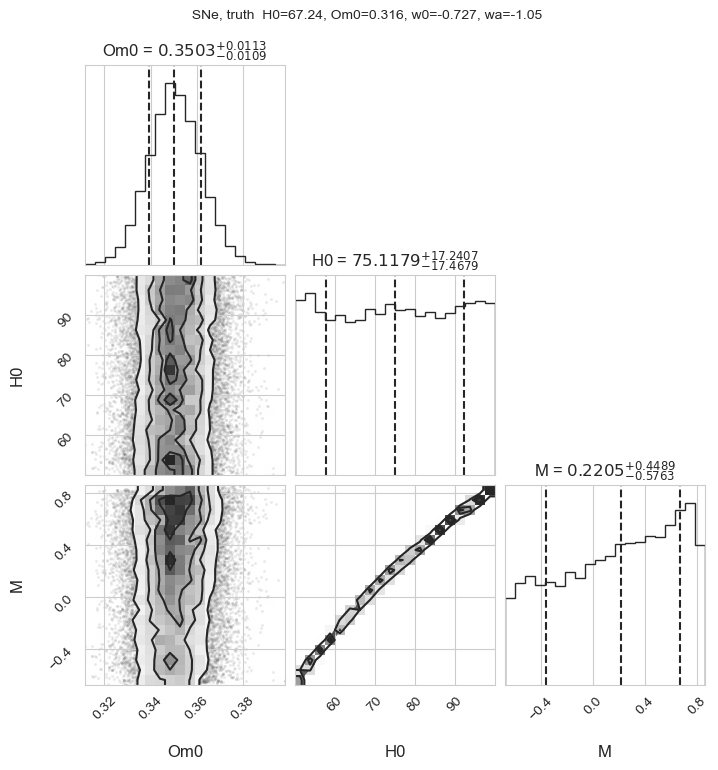

In [3]:
figure4 = corner.corner(samples_sne_combined_with_cov, labels=["Om0", 'H0',"M"],
                        show_titles=True, title_kwargs={"fontsize": 12}, title_fmt=".4f",
                        quantiles=[0.16, 0.5, 0.84], label_kwargs={"fontsize": 12},
                        plot_datapoints=True, plot_density=True)
figure4.suptitle(" SNe, truth  H0=67.24, Om0=0.316, w0=-0.727, wa=-1.05", fontsize=10, y=1.02)
plt.show()

In [9]:
samples_sne_combined_with_cov

array([[ 0.34242333, 68.09331166],
       [ 0.37118572, 67.48371074],
       [ 0.34835744, 67.96752772],
       ...,
       [ 0.350047  , 67.94797538],
       [ 0.35158567, 67.99528355],
       [ 0.36167976, 67.70537378]])

In [4]:
import pickle

# Save the samples to a file
with open('samples_sne_combined_with_cov.pkl', 'wb') as f:
    pickle.dump(samples_sne_combined_with_cov, f)
#with open('samples_sne_combined_with_cov.pkl', 'rb') as f:
 #   samples_sne_combined_with_cov = pickle.load(f)

In [ ]:

from cmb_likelihood_cal_with_sne_cov import run_mcmc_with_cmb,run_gaussian_methods_om0_with_H0_and_CMB_by_multiprocessing
file_path_2 = 'data/fw0wacdm_planck+SN+eBOSS+3x2pt.txt'
data_sn_bao_cmb = pd.read_csv(file_path_2, sep='\s+', comment='#', header=None)
column_names_bao_cmb = [
    'omega_m', 'h0', 'omega_b', 'n_s', 'a_s', 'w', 'wa', 'mnu', 'tau',
    'shear_calibration_m1', 'shear_calibration_m2', 'shear_calibration_m3', 'shear_calibration_m4',
    'wl_photoz_bias_1', 'wl_photoz_bias_2', 'wl_photoz_bias_3', 'wl_photoz_bias_4',
    'lens_photoz_bias_1', 'lens_photoz_bias_2', 'lens_photoz_bias_3', 'lens_photoz_bias_4',
    'lens_photoz_width_1', 'lens_photoz_width_2', 'lens_photoz_width_3', 'lens_photoz_width_4',
    'bias_lens_b1', 'bias_lens_b2', 'bias_lens_b3', 'bias_lens_b4',
    'intrinsic_alignment_a1', 'intrinsic_alignment_a2', 'intrinsic_alignment_alpha1', 'intrinsic_alignment_alpha2',
    'intrinsic_alignment_bias_ta', 'prior', 'like', 'post', 'weight'
]
data_sn_bao_cmb.columns = column_names_bao_cmb
data_sn_bao_cmb = data_sn_bao_cmb[['w', 'wa', 'omega_m','h0']]
data_sn_bao_cmb['h0'] = data_sn_bao_cmb['h0'] * 100
param_combinations_sn_bao_cmb = data_sn_bao_cmb.to_numpy()

random_indices_sbc = np.random.choice(param_combinations_sn_bao_cmb.shape[0], 9999, replace=False)
lw_params_sn_bao_cmb = param_combinations_sn_bao_cmb[random_indices_sbc]

h0_min_sne, omm_min_sne, h0_std_sne, omm_std_sne, h0_min_bao, omm_min_bao, h0_std_bao, omm_std_bao, h0_min_cmb, omm_min_cmb, h0_std_cmb, omm_std_cmb, param=run_gaussian_methods_om0_with_H0_and_CMB_by_multiprocessing(lw_params_sn_bao_cmb, z_all, data_err_all,cov_matrix_sne)

In [6]:
lw_params_sn_bao_cmb

array([[-7.96333182e-01, -6.95961085e-01,  3.26263344e-01,
         6.63324764e+01,  0.00000000e+00],
       [ 1.06610568e-02, -5.89848582e+00,  3.07753712e-01,
         6.92371608e+01,  0.00000000e+00],
       [-5.73190428e-01, -2.24153809e+00,  3.29167670e-01,
         6.68789122e+01,  0.00000000e+00],
       [-9.47580009e-01, -9.30070647e-03,  3.44007687e-01,
         6.38869019e+01,  0.00000000e+00],
       [-8.55928992e-01, -1.01589081e+00,  3.43037551e-01,
         6.54307908e+01,  0.00000000e+00],
       [-7.10867861e-01, -1.37726542e+00,  3.30397670e-01,
         6.63333170e+01,  0.00000000e+00],
       [-3.11738793e+00, -1.72018152e+01,  4.65179022e-01,
         7.40205774e+01,  0.00000000e+00],
       [ 1.30906374e+00, -1.24947229e+01,  2.20107045e-01,
         7.42025263e+01,  0.00000000e+00],
       [-5.10089345e-01, -3.18654612e+00,  3.28615967e-01,
         6.73196680e+01,  0.00000000e+00],
       [-7.47380803e-01, -8.99285444e-01,  3.30004807e-01,
         6.59103346e+01

In [5]:
import pickle

# Combine all results into a dictionary for easy handling
results = {
    "h0_min_sne": h0_min_sne,
    "omm_min_sne": omm_min_sne,
    "h0_std_sne": h0_std_sne,
    "omm_std_sne": omm_std_sne,
    "h0_min_bao": h0_min_bao,
    "omm_min_bao": omm_min_bao,
    "h0_std_bao": h0_std_bao,
    "omm_std_bao": omm_std_bao,
    "h0_min_cmb": h0_min_cmb,
    "omm_min_cmb": omm_min_cmb,
    "h0_std_cmb": h0_std_cmb,
    "omm_std_cmb": omm_std_cmb,
    "param": param
}

with open('results_for_h_omm_with_snecov_correct_obh2.pkl', 'wb') as f:
    pickle.dump(results, f)

In [2]:
import pickle

with open('results_for_h_omm_with_snecov.pkl', 'rb') as f:
    loaded_results = pickle.load(f)
with open('results_for_h_omm_with_snecov.pkl', 'rb') as f:
    loaded_results = pickle.load(f)

# Access the variables from the loaded results
h0_min_sne = loaded_results["h0_min_sne"]
omm_min_sne = loaded_results["omm_min_sne"]
h0_std_sne = loaded_results["h0_std_sne"]
omm_std_sne = loaded_results["omm_std_sne"]
h0_min_bao = loaded_results["h0_min_bao"]
omm_min_bao = loaded_results["omm_min_bao"]
h0_std_bao = loaded_results["h0_std_bao"]
omm_std_bao = loaded_results["omm_std_bao"]
h0_min_cmb = loaded_results["h0_min_cmb"]
omm_min_cmb = loaded_results["omm_min_cmb"]
h0_std_cmb = loaded_results["h0_std_cmb"]
omm_std_cmb = loaded_results["omm_std_cmb"]
param = loaded_results["param"]


In [3]:
omm_oringinal_list_with_cmb = []
for i in range (len(h0_min_sne)):
    omm_oringinal_with_cmb = param[i][2]
    omm_oringinal_list_with_cmb.append(omm_oringinal_with_cmb)

Peak KDE $w_0w_a$ public chain $= 0.32$
Peak for $P(\Omega_{m, 	{SNe}}^{\Lambda 	{CDM}})$: x = 0.3533, y = 1.0000
Peak for $P(\Omega_{m, 	{BAO}}^{\Lambda 	{CDM}})$: x = 0.3037, y = 1.0000
Peak for $P(\Omega_{m, 	{CMB}}^{\Lambda 	{CDM}})$: x = 0.3227, y = 1.0000


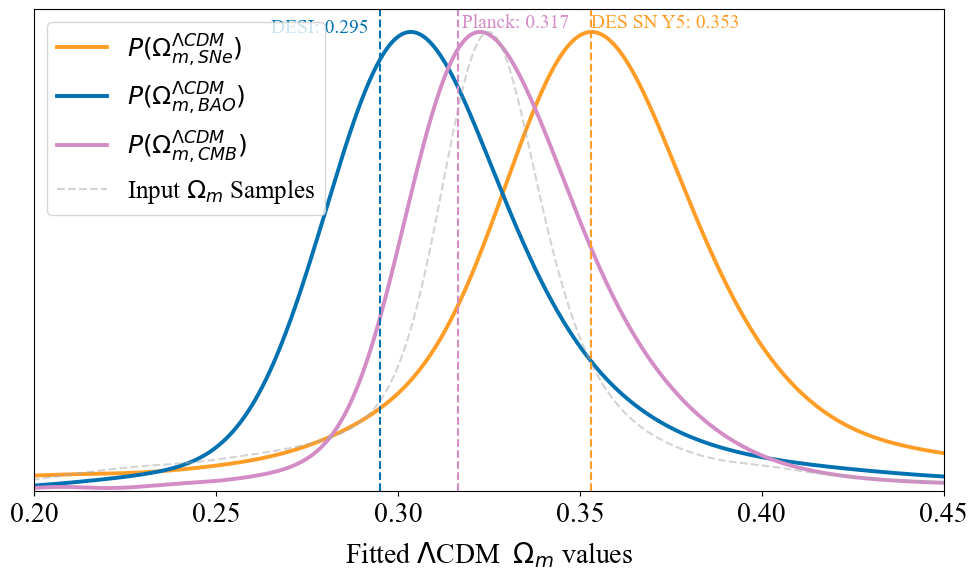

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm
from scipy.stats import gaussian_kde

import pickle
x = np.linspace(0.1, 0.6, 1000)

with open('data/results_for_h_omm_with_snecov.pkl', 'rb') as f:
    results = pickle.load(f)
    
omm_oringinal_with_cmb_array = np.array(omm_oringinal_list_with_cmb)
omm_oringinal_array = omm_oringinal_with_cmb_array[np.isfinite(omm_oringinal_with_cmb_array)]
kde_omm_oringinal = gaussian_kde(omm_oringinal_array)
peak_omm_oringinal = x[np.argmax(kde_omm_oringinal(x))]

print(f"Peak KDE $w_0w_a$ public chain $= {peak_omm_oringinal:.2f}$")

def calculate_om0_distributions(x, omm_min, omm_std, label, color):
    total_distribution = np.zeros_like(x)
    for mu, sigma in zip(omm_min, omm_std):
        if not np.isnan(mu) and not np.isnan(sigma):
            total_distribution += norm.pdf(x, mu, sigma)
    total_distribution /= np.max(total_distribution)
    plt.plot(x, total_distribution, label=label, color=color, linewidth=2.8)
    peak_index = np.argmax(total_distribution)
    peak_x_value = x[peak_index]
    peak_y_value = total_distribution[peak_index]
    print(f"Peak for {label}: x = {peak_x_value:.4f}, y = {peak_y_value:.4f}")
    

    return total_distribution
plt.figure(figsize=(10, 6))


plt.rc('font', family='serif', serif='Times New Roman', size=14)
plt.rcParams['axes.labelsize'] = 14


sne_distribution = calculate_om0_distributions(x, omm_min_sne, omm_std_sne, label='$P(\Omega_{m, \t{SNe}}^{\Lambda \t{CDM}})$', color='#ff9d27')
bao_distribution = calculate_om0_distributions(x, omm_min_bao, omm_std_bao, label='$P(\Omega_{m, \t{BAO}}^{\Lambda \t{CDM}})$', color='#0072B2')
cmb_distribution = calculate_om0_distributions(x, omm_min_cmb, omm_std_cmb, label='$P(\Omega_{m, \t{CMB}}^{\Lambda \t{CDM}})$', color='#d38cc6')

#sne_distribution = calculate_om0_distributions(x, h0_min_sne, h0_std_sne, label='SNe', color='blue')
#bao_distribution = calculate_om0_distributions(x, h0_min_bao, h0_std_bao, label='BAO', color='orange')
#cmb_distribution = calculate_om0_distributions(x, h0_min_cmb, h0_std_cmb, label='CMB', color='green')
plt.plot(x, kde_omm_oringinal(x)/kde_omm_oringinal(peak_omm_oringinal), color='#A9A9A9', linestyle='--',
        label=r"Input $\Omega_m$ Samples", alpha=0.5)

plt.axvline(0.353, color='#ff9d27', linestyle='--', linewidth=1.5)
plt.text(0.353, max(sne_distribution)*1.01, 'DES SN Y5: 0.353', color='#ff9d27')

plt.axvline(0.295, color='#0072B2', linestyle='--', linewidth=1.5)
plt.text(0.265, max(bao_distribution), 'DESI: 0.295', color='#0072B2')

plt.axvline(0.3166, color='#d38cc6', linestyle='--', linewidth=1.5)
plt.text(0.3175, max(cmb_distribution)*1.01, 'Planck: 0.317', color='#d38cc6' )

plt.xlim(0.2, 0.45)
#plt.xlabel('$\Lambda$CDM test\'s $\Omega_{m}$ values\n(Planck+eBoss+DESY5+3x2pt)')
plt.xlabel('Fitted $\Lambda$CDM  $\Omega_{m}$ values', fontsize=20,)
plt.gca().xaxis.set_label_coords(0.5, -0.1)  
#plt.text(0.5, -0.18, r'(Planck+eBoss+DESY5+3x2pt $w_0w_a$ chain)', fontsize=14, ha='center', transform=plt.gca().transAxes)
plt.ylim(0, None)
plt.tick_params(axis='x', labelsize=20)


plt.gca().axes.get_yaxis().set_visible(False)
plt.legend(fontsize=18, loc='upper left')
plt.grid(False)
plt.tight_layout()
plt.savefig("w0wa_to_lcdm_all.png", dpi=400, bbox_inches='tight')

plt.show()

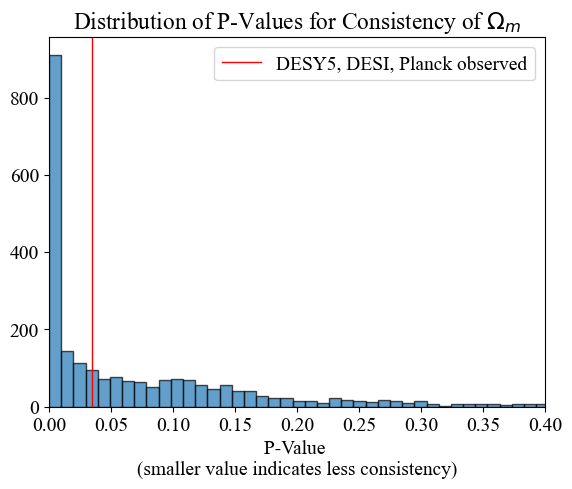

In [7]:
from scipy.stats import chi2

def calculate_p_for_the_same_omm(omm_min_sne, omm_std_sne, omm_min_bao, omm_std_bao, omm_min_cmb, omm_std_cmb):    
    weights_single = 1 / np.array([omm_std_sne**2, omm_std_bao**2, omm_std_cmb**2])
    omm_common_single = np.sum(np.array([omm_min_sne, omm_min_bao, omm_min_cmb]) * weights_single) / np.sum(weights_single)
    
    chi_squared_single = ((omm_min_sne - omm_common_single)**2 / omm_std_sne**2 +
                          (omm_min_bao - omm_common_single)**2 / omm_std_bao**2 +
                          (omm_min_cmb - omm_common_single)**2 / omm_std_cmb**2)
    dof = 2
    p_value_single = 1 - chi2.cdf(chi_squared_single, dof)
   # chis=chi2.cdf(chi_squared_single, dof)
    #p_consistent = 1 - p_value_single

    return p_value_single


omm_min_sne = np.array(omm_min_sne)
omm_std_sne = np.array(omm_std_sne)
omm_min_bao = np.array(omm_min_bao)
omm_std_bao = np.array(omm_std_bao)
omm_min_cmb = np.array(omm_min_cmb)
omm_std_cmb = np.array(omm_std_cmb)

p_values = np.array([calculate_p_for_the_same_omm(omm_min_sne[i], omm_std_sne[i],
                                                  omm_min_bao[i], omm_std_bao[i],
                                                  omm_min_cmb[i], omm_std_cmb[i])
                     for i in range(len(omm_min_sne))])
import matplotlib.pyplot as plt

p_values_filtered = p_values[~np.isnan(p_values)]
a=calculate_p_for_the_same_omm(omm_min_sne=0.353, omm_std_sne=0.017, omm_min_bao=0.295, omm_std_bao=0.015, omm_min_cmb=0.315, omm_std_cmb=0.007)
plt.xlim(0, 0.4)
plt.hist(p_values_filtered, bins=100, edgecolor='black', alpha=0.7)
plt.axvline(a, color='red', linestyle='-', linewidth=1, label='DESY5, DESI, Planck observed')
plt.xlabel("P-Value \n(smaller value indicates less consistency)")
plt.title("Distribution of P-Values for Consistency of $\Omega_m$")
#plt.axvline(np.mean(p_values_filtered), color='green', linestyle='-', linewidth=1, label='Mean P-Value')
plt.legend()
plt.show()

In [9]:
count_less_than_a = np.sum(p_values_filtered < a)

proportion_less_than_a = count_less_than_a / len(p_values_filtered)

print(f"Number of p-values less than a: {count_less_than_a}")
print(f"Proportion of p-values less than a: {proportion_less_than_a:.2%}")

count_less_than_005 = np.sum(p_values_filtered < 0.05)

proportion_less_than_005 = count_less_than_005 / len(p_values_filtered)

print(f"Number of p-values less than 005: {count_less_than_005}")
print(f"Proportion of p-values less than 005: {proportion_less_than_005:.2%}")


Number of p-values less than a: 1223
Proportion of p-values less than a: 50.14%
Number of p-values less than 005: 1342
Proportion of p-values less than 005: 55.02%


In [10]:
h0_oringinal_list_with_cmb = []
for i in range (len(h0_min_sne)):
    h0_oringinal_with_cmb = param[i][3]
    h0_oringinal_list_with_cmb.append(h0_oringinal_with_cmb)

In [11]:
h0_std_bao

[nan,
 nan,
 nan,
 0.6562897888197433,
 0.5639806263205827,
 nan,
 0.54278548272534,
 0.6133448132337381,
 nan,
 nan,
 0.5873082138377177,
 nan,
 0.6183247983876614,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 0.6338234253826284,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 0.6505207864263693,
 0.5751014213100472,
 nan,
 nan,
 0.623040874205105,
 nan,
 nan,
 nan,
 0.670702284420409,
 nan,
 0.6280943250007681,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 0.6660315974209691,
 0.6482010570776467,
 0.6681631525642916,
 nan,
 nan,
 0.6259492555287558,
 nan,
 nan,
 nan,
 0.6137867720296484,
 0.6187848106177001,
 nan,
 nan,
 nan,
 nan,
 0.599701493573884,
 nan,
 nan,
 0.6253279448713222,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 0.6126228906064195,
 nan,
 nan,
 0.6101069985816825,
 nan,
 0.6448052392631394,
 0.6300936936141264,
 nan,
 0.6019001002962698,
 0.6159108892638202,
 nan,
 0.649663481320093,
 nan,
 0.628114288736339,
 nan,
 nan,
 0.651450291744412,
 0.6099307028977807,


Peak KDE BAO = 67.65
Peak KDE CMB = 66.65


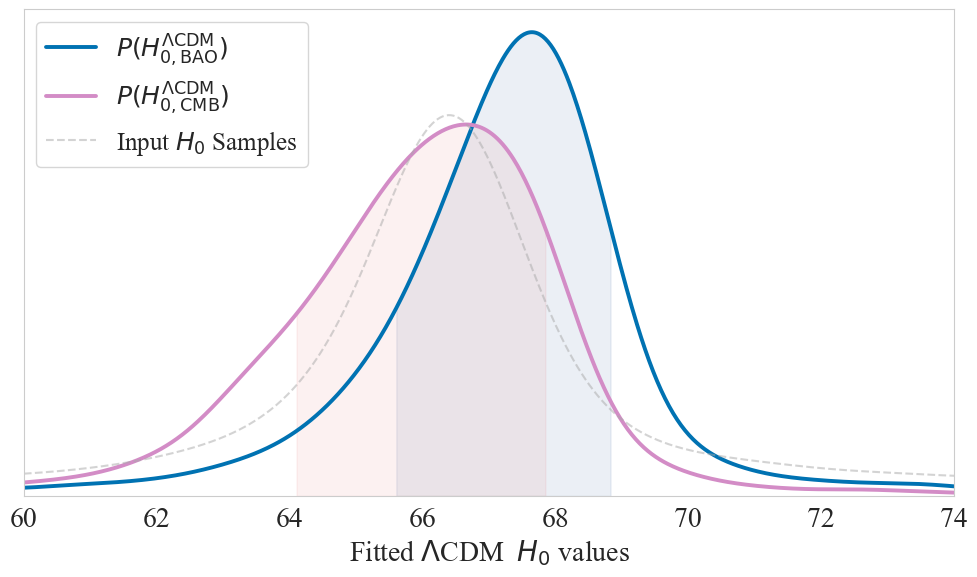

In [12]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde

h0_min_bao_all = np.array(h0_min_bao)
h0_min_cmb_with_cmb = np.array(h0_min_cmb)
h0_oringinal_array = np.array(h0_oringinal_list_with_cmb)

ho_std_bao = np.array(h0_std_bao)
ho_std_cmb = np.array(h0_std_cmb)

# Filter out non-finite values
h0_min_bao_all = h0_min_bao_all[np.isfinite(h0_min_bao_all)]
h0_min_cmb_with_cmb = h0_min_cmb_with_cmb[np.isfinite(h0_min_cmb_with_cmb)]
h0_bao_std = ho_std_bao[np.isfinite(ho_std_bao)]  # Corrected line
h0_cmb_std = ho_std_cmb[np.isfinite(ho_std_cmb)]
h0_oringinal_array = h0_oringinal_array[np.isfinite(h0_oringinal_array)]

# Assuming h0_min_bao_all, h0_min_cmb_with_cmb, h0_oringinal_array are defined
# Compute KDEs
kde_bao = gaussian_kde(h0_min_bao_all)
kde_cmb_with_cmb = gaussian_kde(h0_min_cmb_with_cmb)
kde_h0_oringinal = gaussian_kde(h0_oringinal_array)

x_values = np.linspace(60, 80, 1000)

peak_bao = x_values[np.argmax(kde_bao(x_values))]
peak_cmb_with_cmb = x_values[np.argmax(kde_cmb_with_cmb(x_values))]
peak_h0_oringinal = x_values[np.argmax(kde_h0_oringinal(x_values))]

print(f"Peak KDE BAO = {peak_bao:.2f}")
print(f"Peak KDE CMB = {peak_cmb_with_cmb:.2f}")

cdf_bao = np.cumsum(kde_bao(x_values)) / np.sum(kde_bao(x_values))  # Normalize to get CDF
lower_idx_bao = np.argmax(cdf_bao >= 0.16)
upper_idx_bao = np.argmax(cdf_bao >= 0.84)
x_lower_bao, x_upper_bao = x_values[lower_idx_bao], x_values[upper_idx_bao]

cdf_cmb = np.cumsum(kde_cmb_with_cmb(x_values)) / np.sum(kde_cmb_with_cmb(x_values))
lower_idx_cmb = np.argmax(cdf_cmb >= 0.16)
upper_idx_cmb = np.argmax(cdf_cmb >= 0.84)
x_lower_cmb, x_upper_cmb = x_values[lower_idx_cmb], x_values[upper_idx_cmb]

# Plot
plt.figure(figsize=(10, 6))

plt.plot(x_values, kde_bao(x_values), color='#0072B2', linestyle='-', 
         label=r'$P(H_{0,\text{BAO}}^{\Lambda \text{CDM}})$', linewidth=2.8)
plt.plot(x_values, kde_cmb_with_cmb(x_values), color='#d38cc6', linestyle='-', 
         label=r'$P(H_{0,\text{CMB}}^{\Lambda \text{CDM}})$', linewidth=2.8)
plt.plot(x_values, kde_h0_oringinal(x_values), color='#A9A9A9', linestyle='--', 
         label=r"Input $H_0$ Samples", alpha=0.5)

#plt.axvline(peak_bao, color='#0072B2', linestyle='--',linewidth=1.5,)
            #label=rf'Peak KDE BAO $= {peak_bao:.2f}$')
#plt.axvline(peak_cmb_with_cmb, color='#d38cc6', linestyle='--',linewidth=1.5 )
           # label=rf'Peak KDE CMB $= {peak_cmb_with_cmb:.2f}$')
#plt.axvline(peak_h0_oringinal, color='#A9A9A9', linestyle='--', linewidth=1.0)
            #label=rf'Peak KDE $w_0w_a$ public chain $= {peak_h0_oringinal:.2f}$')

plt.fill_between(x_values[lower_idx_bao:upper_idx_bao+1], kde_bao(x_values)[lower_idx_bao:upper_idx_bao+1], 
                 color='#3D65A5', alpha=0.1,)# label=r'68% region BAO')
plt.fill_between(x_values[lower_idx_cmb:upper_idx_cmb+1], kde_cmb_with_cmb(x_values)[lower_idx_cmb:upper_idx_cmb+1], 
                 color='#E57A77', alpha=0.1,) #label=r'68% region CMB')
plt.ylim(0, None)

plt.xlabel('Fitted $\Lambda$CDM  $H_0$ values', fontsize=20,)
#plt.gca().xaxis.set_label_coords(0.5, -0.1)  
plt.gca().axes.get_yaxis().set_visible(False)

plt.xlim(60, 74)
plt.tick_params(axis='x', labelsize=20)


plt.gca().axes.get_yaxis().set_visible(False)
plt.legend(fontsize=18, loc='upper left')

#plt.text(0.5, -0.18, r'(Planck+eBoss+DESY5+3x2pt $w_0w_a$ chain)', fontsize=14, ha='center', transform=plt.gca().transAxes)

plt.legend(fontsize=18, loc='upper left')
plt.grid(False)

plt.tight_layout()

plt.savefig("H0_cmb_bao.png", dpi=400, bbox_inches='tight')
plt.show()


In [ ]:
from cmb_likelihood_cal_with_sne_cov import run_lcdm_methods_om0_with_cmb_by_multiprocessing

#w0_range = np.linspace(-1.2, -0.2, 70)
#wa_range = np.linspace(-4, 1, 75)
#omm_values = np.linspace(0.25, 0.45, 60)

#w0_range = np.linspace(-1.2, -0.2, 70)
#wa_range = np.linspace(-4, 1, 75)
#omm_values = np.linspace(0.25, 0.45, 60)

w0_range = np.linspace(-1.2, -0.1, 45)
wa_range = np.linspace(-4, 1, 55)
omm_values = np.linspace(0.23, 0.4, 40)

h0_value = 67.24

z_all = {'sne': z_desy5, 'dv': zeff_array, 'fap': zeff_fap}
data_err_all = {'sne': distmod_error_desy5, 'dv': delta_dv, 'fap': delta_fap}
_param_combinations = np.array(np.meshgrid(w0_range, wa_range, omm_values)).T.reshape(-1, 3)


h0_column = np.full((_param_combinations.shape[0], 1), h0_value)  # Create a column of h0_value
param_combinations_with_h0 = np.hstack((_param_combinations, h0_column))

params, result_sne, result_bao, result_cmb = run_lcdm_methods_om0_with_cmb_by_multiprocessing(
    param_combinations_with_h0,
    z_all,
    data_err_all,
)

In [4]:
import pandas as pd
import numpy as np
from chainconsumer import Chain, ChainConfig, ChainConsumer, PlotConfig, Truth, make_sample
from scipy import stats


def calculate_probabilities(true_value, measurements):
    probabilities = []
    for mean, uncertainty in measurements:
        z = (true_value - mean) / uncertainty
        prob = stats.norm.cdf(z)
        probabilities.append(prob)
    return probabilities
true_value_sne = 0.353 
true_value_bao = 0.295 
true_value_cmb = 0.315

df = pd.DataFrame(params, columns=['w0', 'wa', 'omm', 'h0'])

df['result_sne'] = [float(x[0]) if isinstance(x, list) else float(x) for x in result_sne]
df['result_bao'] = [float(x[0]) if isinstance(x, list) else float(x) for x in result_bao]
df['result_cmb'] = [float(x[0]) if isinstance(x, list) else float(x) for x in result_cmb]


df_grid = pd.DataFrame({
    "w": df["w0"],
    "wa": df["wa"],
    "omega_m": df["omm"],
    "result_sne": df["result_sne"],
    "result_bao": df["result_bao"],
    "result_cmb": df["result_cmb"]
})


save_path = 'w0wa_for_lcdm_omm_cmb_sne_bao_with_covmat.csv'
df_grid.to_csv(save_path, index=False)

In [6]:
import numpy as np
import pandas as pd

# Existing ranges
w0_range = np.linspace(-1.2, -0.1, 45)
omm_values = np.linspace(0.23, 0.4, 40)
h0_value = 67.24

delta_wa = (1 - (-4)) / (55 - 1)  # Existing delta_wa ~0.09259259

num_new_wa_points = int(((-4) - (-6)) / delta_wa) + 1  # Calculate the number of new points
wa_range_new = np.linspace(-6, -4, num_new_wa_points)

# Generate new parameter combinations
_param_combinations_new = np.array(np.meshgrid(w0_range, wa_range_new, omm_values)).T.reshape(-1, 3)

# Add h0_value to the new parameter combinations
h0_column_new = np.full((_param_combinations_new.shape[0], 1), h0_value)
param_combinations_with_h0_new = np.hstack((_param_combinations_new, h0_column_new))

# Now run the calculations only for the new parameter combinations
params_new, result_sne_new, result_bao_new, result_cmb_new = run_lcdm_methods_om0_with_cmb_by_multiprocessing(
    param_combinations_with_h0_new,
    z_all,
    data_err_all,
)

# Create a DataFrame from the new results
df_new = pd.DataFrame(params_new, columns=['w0', 'wa', 'omm', 'h0'])
df_new['result_sne'] = [float(x[0]) if isinstance(x, list) else float(x) for x in result_sne_new]
df_new['result_bao'] = [float(x[0]) if isinstance(x, list) else float(x) for x in result_bao_new]
df_new['result_cmb'] = [float(x[0]) if isinstance(x, list) else float(x) for x in result_cmb_new]

# Prepare the new DataFrame for saving
df_grid_new = pd.DataFrame({
    "w": df_new["w0"],
    "wa": df_new["wa"],
    "omega_m": df_new["omm"],
    "result_sne": df_new["result_sne"],
    "result_bao": df_new["result_bao"],
    "result_cmb": df_new["result_cmb"]
})

# Read the existing CSV file
save_path = 'w0wa_for_lcdm_omm_cmb_sne_bao_with_covmat.csv'
df_existing = pd.read_csv(save_path)

df_combined = pd.concat([df_existing, df_grid_new], ignore_index=True)

df_combined = df_combined.drop_duplicates(subset=['w', 'wa', 'omega_m'], keep='first')

df_combined.to_csv(save_path, index=False)


Processing:   0%|          | 0/39600 [00:00<?, ?it/s]

/Users/tz/anaconda3/envs/cosmosis-env/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/tz/anaconda3/envs/cosmosis-env/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/tz/anaconda3/envs/cosmosis-env/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/tz/anaconda3/envs/cosmosis-env/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/tz/anaconda3/envs/cosmosis-env/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/tz/anaconda3/envs/cosmosis-env/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered

In [ ]:
import numpy as np
import pandas as pd

# Existing ranges
wa_range = np.linspace(-6, 1, 77)  # Including the previous extension from -6 to -4
omm_values = np.linspace(0.23, 0.4, 40)
h0_value = 67.24

# Calculate the existing delta for w0_range
delta_w0 = (-0.1 - (-1.2)) / (45 - 1)  # Existing delta_w0 ~0.025
delta_w0 = (-0.1 - (-1.2)) / (44)      # Corrected calculation
delta_w0 = (1.1) / 44                   # delta_w0 ~0.025

# Generate the new w0_range from -0.1 to 0.1 with the same interval
num_new_w0_points = int((0.1 - (-0.1)) / delta_w0) + 1  # Calculate the number of new points
w0_range_new = np.linspace(-0.1, 0.1, num_new_w0_points)

# Combine the existing w0_range and new w0_range, ensuring no duplicates
w0_range_existing = np.linspace(-1.2, -0.1, 45)
w0_range_combined = np.unique(np.concatenate((w0_range_existing, w0_range_new)))

# Generate parameter combinations using the new w0 values (from -0.1 to 0.1)
# We need to find the new w0 values not in the existing CSV
w0_new_values = np.setdiff1d(w0_range_combined, w0_range_existing)

# Generate new parameter combinations with the new w0 values
# Using the full wa_range (including the extension from -6 to 1)
_param_combinations_new = np.array(np.meshgrid(w0_new_values, wa_range, omm_values)).T.reshape(-1, 3)

# Read the existing CSV file to avoid re-computation
save_path = 'w0wa_for_lcdm_omm_cmb_sne_bao_with_covmat.csv'
df_existing = pd.read_csv(save_path)

# Create a DataFrame for the new parameter combinations
df_params_new = pd.DataFrame(_param_combinations_new, columns=['w0', 'wa', 'omm'])

# Remove parameter combinations that already exist in the CSV
df_combined_existing = df_existing[['w', 'wa', 'omega_m']].rename(columns={'w': 'w0', 'omega_m': 'omm'})
df_params_new = df_params_new.merge(df_combined_existing, on=['w0', 'wa', 'omm'], how='left', indicator=True)
df_params_new = df_params_new[df_params_new['_merge'] == 'left_only'].drop(columns=['_merge'])

# If there are no new parameter combinations, exit
if df_params_new.empty:
    print("No new parameter combinations to compute.")
else:
    # Add h0_value to the new parameter combinations
    h0_column_new = np.full((df_params_new.shape[0], 1), h0_value)
    param_combinations_with_h0_new = np.hstack((df_params_new.values, h0_column_new))

    # Now run the calculations only for the new parameter combinations
    params_new, result_sne_new, result_bao_new, result_cmb_new = run_lcdm_methods_om0_with_cmb_by_multiprocessing(
        param_combinations_with_h0_new,
        z_all,
        data_err_all,
    )

    # Create a DataFrame from the new results
    df_results_new = pd.DataFrame(params_new, columns=['w0', 'wa', 'omm', 'h0'])
    df_results_new['result_sne'] = [float(x[0]) if isinstance(x, list) else float(x) for x in result_sne_new]
    df_results_new['result_bao'] = [float(x[0]) if isinstance(x, list) else float(x) for x in result_bao_new]
    df_results_new['result_cmb'] = [float(x[0]) if isinstance(x, list) else float(x) for x in result_cmb_new]

    # Prepare the new DataFrame for saving
    df_grid_new = pd.DataFrame({
        "w": df_results_new["w0"],
        "wa": df_results_new["wa"],
        "omega_m": df_results_new["omm"],
        "result_sne": df_results_new["result_sne"],
        "result_bao": df_results_new["result_bao"],
        "result_cmb": df_results_new["result_cmb"]
    })

    # Append the new data to the existing DataFrame
    df_combined = pd.concat([df_existing, df_grid_new], ignore_index=True)

    # Remove duplicates if any
    df_combined = df_combined.drop_duplicates(subset=['w', 'wa', 'omega_m'], keep='first')

    # Save the combined DataFrame back to the CSV file
    df_combined.to_csv(save_path, index=False)

    print("New parameter combinations computed and results appended to the CSV file.")

In [ ]:
import pandas as pd
import numpy as np
from chainconsumer import Chain, ChainConfig, ChainConsumer, PlotConfig, Truth, make_sample
from scipy import stats

def calculate_probabilities(true_value, measurements):
    probabilities = []
    for mean, uncertainty in measurements:
        z = (true_value - mean) / uncertainty
        prob = stats.norm.cdf(z)
        probabilities.append(prob)
    return probabilities

true_value_sne = 0.353 
true_value_bao = 0.295 
true_value_cmb = 0.315



In [11]:

from cmb_likelihood_cal_with_sne_cov import run_mcmc_with_cmb,run_gaussian_methods_om0_with_H0_and_CMB_by_multiprocessing
file_path_2 = 'fw0wacdm_planck+SN+eBOSS+3x2pt.txt'
data_sn_bao_cmb = pd.read_csv(file_path_2, sep='\s+', comment='#', header=None)
column_names_bao_cmb = [
    'omega_m', 'h0', 'omega_b', 'n_s', 'a_s', 'w', 'wa', 'mnu', 'tau',
    'shear_calibration_m1', 'shear_calibration_m2', 'shear_calibration_m3', 'shear_calibration_m4',
    'wl_photoz_bias_1', 'wl_photoz_bias_2', 'wl_photoz_bias_3', 'wl_photoz_bias_4',
    'lens_photoz_bias_1', 'lens_photoz_bias_2', 'lens_photoz_bias_3', 'lens_photoz_bias_4',
    'lens_photoz_width_1', 'lens_photoz_width_2', 'lens_photoz_width_3', 'lens_photoz_width_4',
    'bias_lens_b1', 'bias_lens_b2', 'bias_lens_b3', 'bias_lens_b4',
    'intrinsic_alignment_a1', 'intrinsic_alignment_a2', 'intrinsic_alignment_alpha1', 'intrinsic_alignment_alpha2',
    'intrinsic_alignment_bias_ta', 'prior', 'like', 'post', 'weight'
]
data_sn_bao_cmb.columns = column_names_bao_cmb
data_sn_bao_cmb = data_sn_bao_cmb[['w', 'wa', 'omega_m','h0']]
data_sn_bao_cmb['h0'] = data_sn_bao_cmb['h0'] * 100
param_combinations_sn_bao_cmb = data_sn_bao_cmb.to_numpy()

random_indices_sbc = np.random.choice(param_combinations_sn_bao_cmb.shape[0], 8888 , replace=False)
lw_params_sn_bao_cmb = param_combinations_sn_bao_cmb[random_indices_sbc]
lw_params_sn_bao_cmb

array([[-7.75663981e-01, -1.06103373e+00,  3.31234728e-01,
         6.60707388e+01],
       [-7.56768333e-01, -1.04096043e+00,  3.30076542e-01,
         6.61870535e+01],
       [-1.26249151e-02, -5.57705869e+00,  3.16449205e-01,
         6.73384262e+01],
       ...,
       [ 4.70264679e-01, -8.29411401e+00,  1.89180141e-01,
         8.12915335e+01],
       [-6.49661763e-01, -2.28800905e+00,  3.27224938e-01,
         6.66887828e+01],
       [-4.06064841e-01, -2.86603919e+00,  3.45102457e-01,
         6.54192790e+01]])

In [22]:
lw_params = np.array([-1, 0, 0.31, 68])

lw_params_repeated = np.tile(lw_params, (10, 1))

lw_params_repeated

array([[-1.  ,  0.  ,  0.31, 68.  ],
       [-1.  ,  0.  ,  0.31, 68.  ],
       [-1.  ,  0.  ,  0.31, 68.  ],
       [-1.  ,  0.  ,  0.31, 68.  ],
       [-1.  ,  0.  ,  0.31, 68.  ],
       [-1.  ,  0.  ,  0.31, 68.  ],
       [-1.  ,  0.  ,  0.31, 68.  ],
       [-1.  ,  0.  ,  0.31, 68.  ],
       [-1.  ,  0.  ,  0.31, 68.  ],
       [-1.  ,  0.  ,  0.31, 68.  ]])

In [23]:

_h0_min_sne, _omm_min_sne, _h0_std_sne, _omm_std_sne, _h0_min_bao, _omm_min_bao, _h0_std_bao, _omm_std_bao, _h0_min_cmb, _omm_min_cmb, _h0_std_cmb, _omm_std_cmb, _param = run_gaussian_methods_om0_with_H0_and_CMB_by_multiprocessing(lw_params_repeated, z_all, data_err_all, cov_matrix_sne)

Processing:   0%|          | 0/10 [00:00<?, ?it/s]

In [24]:
_h0_min_sne, _omm_min_sne, _h0_std_sne, _omm_std_sne, _h0_min_bao, _omm_min_bao, _h0_std_bao, _omm_std_bao, _h0_min_cmb, _omm_min_cmb, _h0_std_cmb, _omm_std_cmb

([nan, nan, nan, nan, nan, nan, nan, nan, nan, nan],
 [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan],
 [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan],
 [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan],
 [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan],
 [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan],
 [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan],
 [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan],
 [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan],
 [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan],
 [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan],
 [nan, nan, nan, nan, nan, nan, nan, nan, nan, nan])

100%|██████████| 1600/1600 [1:05:33<00:00,  2.46s/it]


IndexError: list index out of range

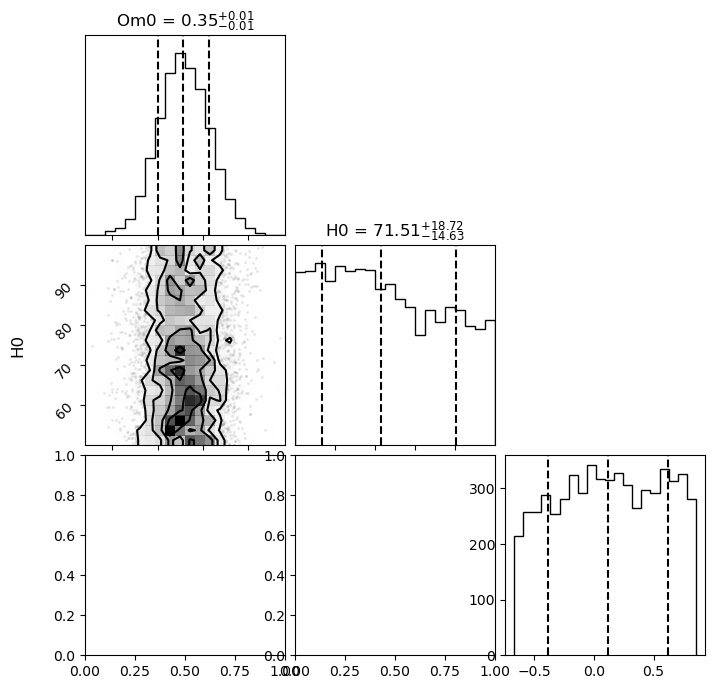

In [2]:
from wowadis_muilt_withcovmat_marginalH0 import run_mcmc_with_cov
from wowadis_muilt_withcovmat_marginalH0 import sne_distmod_marginal_h0
initial_guess_bao_combine = [0.3, 70,0]

des_sne_cosmo_wowachose = Flatw0waCDM(H0=67.24, Om0=0.316, w0=-0.727, wa=-1.05)
des_distmod_compare_desy5_wowachose = sne_distmod_marginal_h0(z=z_desy5, H0=67.24, Om0=0.316, w0=-0.727, wa=-1.05,cosmo=des_sne_cosmo_wowachose,model_M=0)

samples_sne_combined_with_cov = run_mcmc_with_cov(z=z_desy5, data_obs=des_distmod_compare_desy5_wowachose, data_err=distmod_error_desy5,
                                type='sne_lcdm_distmod_with_H0',
                                initial_guess=initial_guess_bao_combine, ndim=3, nwalkers=98, nsteps=1600, nburn=700,
                                nthin=15,cov_matrix_sne=cov_matrix_sne)


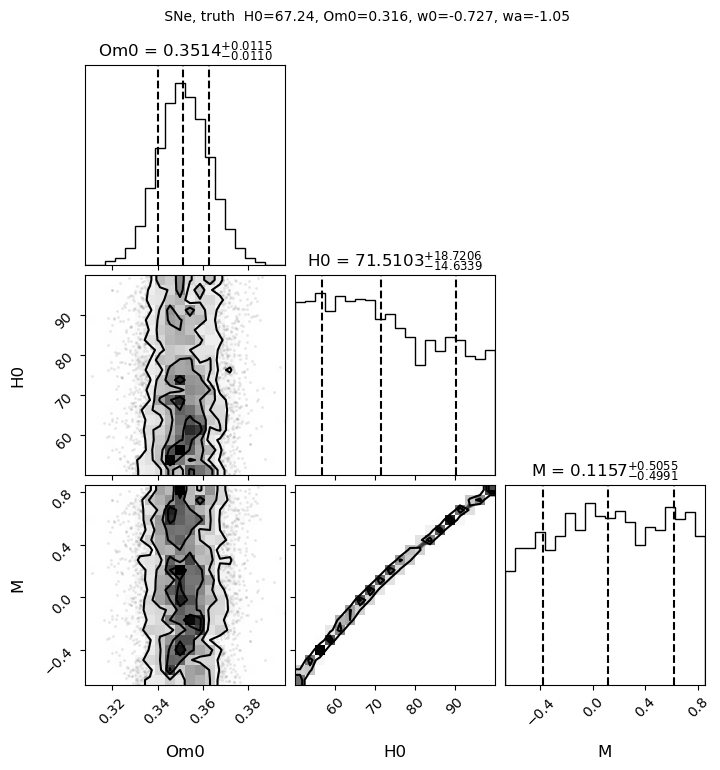

In [5]:
figure4 = corner.corner(samples_sne_combined_with_cov, labels=["Om0", 'H0','M'],
                        show_titles=True, title_kwargs={"fontsize": 12},
    title_fmt=".4f",
                        quantiles=[0.16, 0.5, 0.84], label_kwargs={"fontsize": 12},
                        plot_datapoints=True, plot_density=True)
figure4.suptitle(" SNe, truth  H0=67.24, Om0=0.316, w0=-0.727, wa=-1.05", fontsize=10, y=1.02)
plt.show()

In [3]:
import pandas as pd
import numpy as np
from cmb_likelihood_cal_with_sne_cov_marginalH0 import run_mcmc_with_cmb,run_gaussian_methods_om0_with_H0_and_CMB_by_multiprocessing
file_path_2 = 'fw0wacdm_planck+SN+eBOSS+3x2pt.txt'
data_sn_bao_cmb = pd.read_csv(file_path_2, sep='\s+', comment='#', header=None)
column_names_bao_cmb = [
    'omega_m', 'h0', 'omega_b', 'n_s', 'a_s', 'w', 'wa', 'mnu', 'tau',
    'shear_calibration_m1', 'shear_calibration_m2', 'shear_calibration_m3', 'shear_calibration_m4',
    'wl_photoz_bias_1', 'wl_photoz_bias_2', 'wl_photoz_bias_3', 'wl_photoz_bias_4',
    'lens_photoz_bias_1', 'lens_photoz_bias_2', 'lens_photoz_bias_3', 'lens_photoz_bias_4',
    'lens_photoz_width_1', 'lens_photoz_width_2', 'lens_photoz_width_3', 'lens_photoz_width_4',
    'bias_lens_b1', 'bias_lens_b2', 'bias_lens_b3', 'bias_lens_b4',
    'intrinsic_alignment_a1', 'intrinsic_alignment_a2', 'intrinsic_alignment_alpha1', 'intrinsic_alignment_alpha2',
    'intrinsic_alignment_bias_ta', 'prior', 'like', 'post', 'weight'
]
data_sn_bao_cmb.columns = column_names_bao_cmb
data_sn_bao_cmb = data_sn_bao_cmb[['w', 'wa', 'omega_m','h0']]
data_sn_bao_cmb['M'] = 0

data_sn_bao_cmb['h0'] = data_sn_bao_cmb['h0'] * 100
param_combinations_sn_bao_cmb = data_sn_bao_cmb.to_numpy()

random_indices_sbc = np.random.choice(param_combinations_sn_bao_cmb.shape[0], 11000, replace=False)
lw_params_sn_bao_cmb = param_combinations_sn_bao_cmb[random_indices_sbc]

h0_min_sne, omm_min_sne, h0_std_sne, omm_std_sne, h0_min_bao, omm_min_bao, h0_std_bao, omm_std_bao, h0_min_cmb, omm_min_cmb, h0_std_cmb, omm_std_cmb, param=run_gaussian_methods_om0_with_H0_and_CMB_by_multiprocessing(lw_params_sn_bao_cmb, z_all, data_err_all,cov_matrix_sne)

Processing:   0%|          | 0/11000 [00:00<?, ?it/s]

/Users/tz/anaconda3/envs/cosmosis-env/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/tz/anaconda3/envs/cosmosis-env/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/tz/anaconda3/envs/cosmosis-env/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/tz/anaconda3/envs/cosmosis-env/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/tz/anaconda3/envs/cosmosis-env/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered in subtract
  df = fun(x) - f0
/Users/tz/anaconda3/envs/cosmosis-env/lib/python3.10/site-packages/scipy/optimize/_numdiff.py:590: RuntimeWarning: invalid value encountered

Invalid CMB params: [-7.98076473  5.31978372  0.37769642 70.06079603  0.        ]
Invalid CMB params: [ -8.70582844 -13.33909858   0.23745581  84.05766864   0.        ]
Invalid CMB params: [-9.90051723 -2.50382931  0.50722571 58.23110315  0.        ]
Invalid CMB params: [ -2.00611476 -11.65866305   0.29871617  74.00853114   0.        ]
Singular matrix for params: [-9.55836272e-01 -5.17798553e-02  3.31856030e-01  6.54335431e+01
  0.00000000e+00]
Invalid CMB params: [ -0.94855093 -16.60503214   0.24897678  70.21492497   0.        ]
Singular matrix for params: [-0.8959683  -0.20173398  0.3161155  66.74875597  0.        ]
Singular matrix for params: [-0.83586518 -0.40748     0.32497408 66.28803519  0.        ]
Invalid CMB params: [-4.78064857 -2.59219977  0.2567819  82.99108096  0.        ]
Singular matrix for params: [-0.93379258 -0.21799985  0.32388361 66.37142569  0.        ]
Singular matrix for params: [-0.92175915 -0.35244146  0.30870655 67.8009068   0.        ]
Singular matrix for pa

In [4]:
import pickle

# Combine all results into a dictionary for easy handling
results = {
    "h0_min_sne": h0_min_sne,
    "omm_min_sne": omm_min_sne,
    "h0_std_sne": h0_std_sne,
    "omm_std_sne": omm_std_sne,
    "h0_min_bao": h0_min_bao,
    "omm_min_bao": omm_min_bao,
    "h0_std_bao": h0_std_bao,
    "omm_std_bao": omm_std_bao,
    "h0_min_cmb": h0_min_cmb,
    "omm_min_cmb": omm_min_cmb,
    "h0_std_cmb": h0_std_cmb,
    "omm_std_cmb": omm_std_cmb,
    "param": param
}

with open('results_for_h_omm_with_snecov_correct_obh2_marginalH0.pkl', 'wb') as f:
    pickle.dump(results, f)